In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns

In [2]:
df = pd.read_csv('parkinsons_updrs.data')

In [5]:
df.head()

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


In [4]:
df.shape

(5875, 22)

In [6]:
df.columns

Index(['subject#', 'age', 'sex', 'test_time', 'motor_UPDRS', 'total_UPDRS',
       'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Jitter:DDP',
       'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE'],
      dtype='object')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


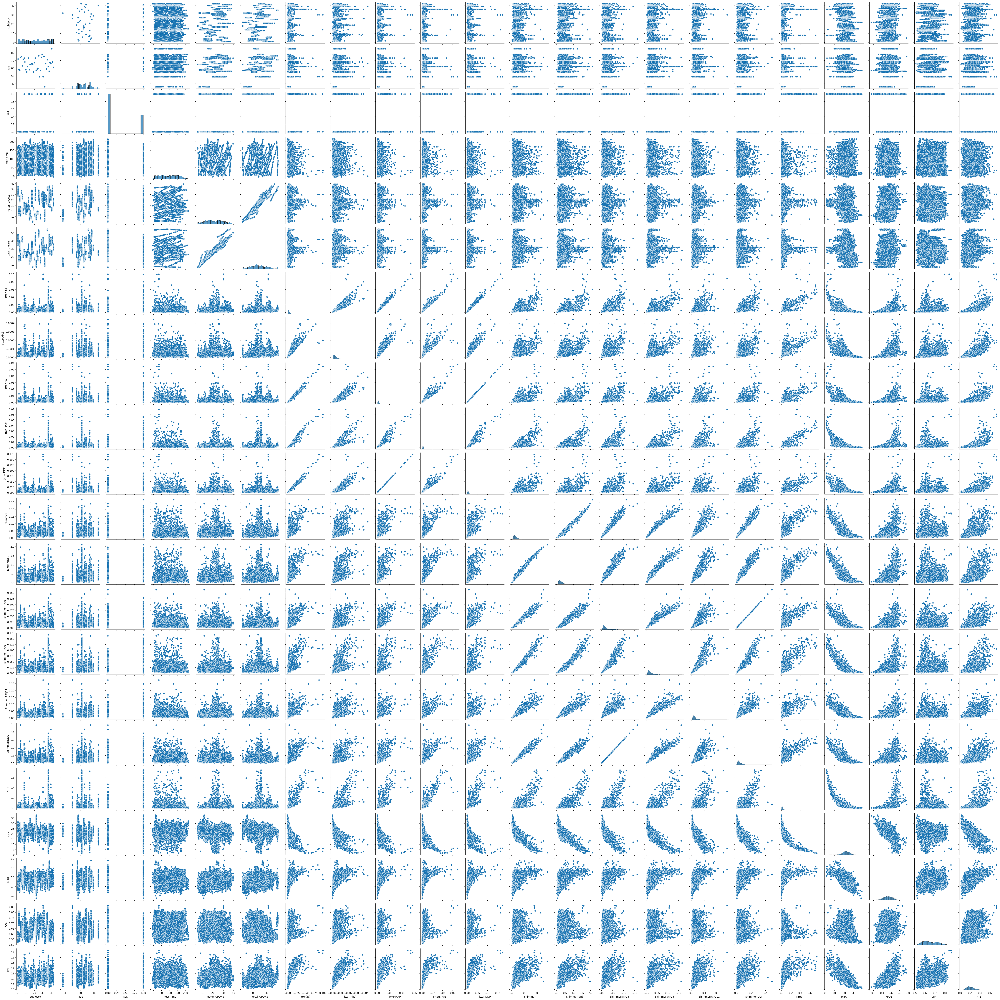

In [17]:
sns.pairplot(df)

In [7]:
features = ['subject#', 'age', 'sex', 'test_time',
       'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Jitter:DDP',
       'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE']

labels = ['motor_UPDRS', 'total_UPDRS']

In [28]:
corr_mat = df[['age', 'sex', 'test_time',
       'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Jitter:DDP',
       'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE', 'motor_UPDRS', 'total_UPDRS']].corr()

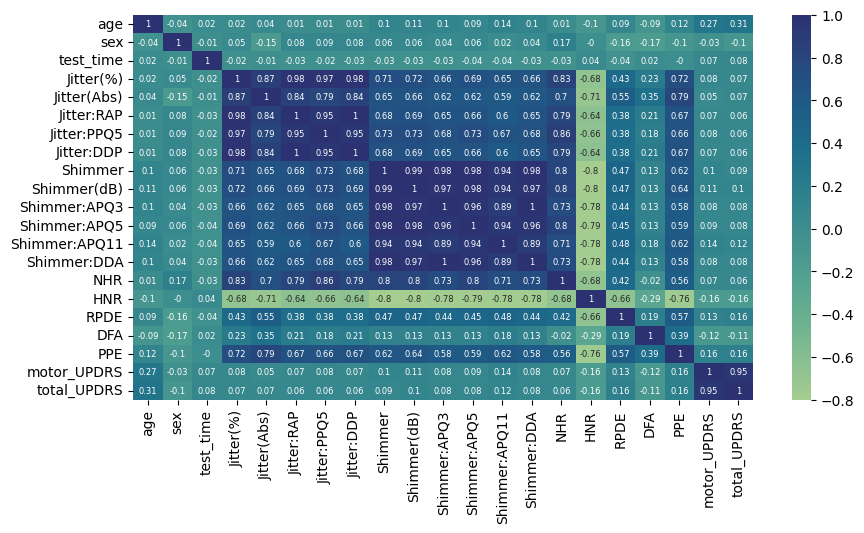

In [40]:
plt.figure(figsize = (10,5))
sns.heatmap(corr_mat.round(2), cmap = 'crest', annot=True, annot_kws={'size':6})
plt.show()

In [41]:
X = df[features]
X = X.drop(['subject#','test_time'], axis = 1)
X
y = df[labels]


In [43]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

In [50]:
scaler = StandardScaler()
X_noage = X[['age', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5',
       'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE']]
X_noage_scaled = scaler.fit_transform(X_noage)

In [53]:
X_noage_scaled_df = pd.DataFrame(X_noage_scaled)

In [58]:
X_scaled_withAge= pd.concat([X_noage_scaled_df, X['sex']],axis=1)

In [60]:
tsne = TSNE(n_components=2)
tsne_data = tsne.fit_transform(np.array(X_scaled_withAge))

In [64]:
from sklearn.decomposition import PCA

In [65]:
pca = PCA(n_components=2)

pca_data = pca.fit_transform(np.array(X_scaled_withAge))

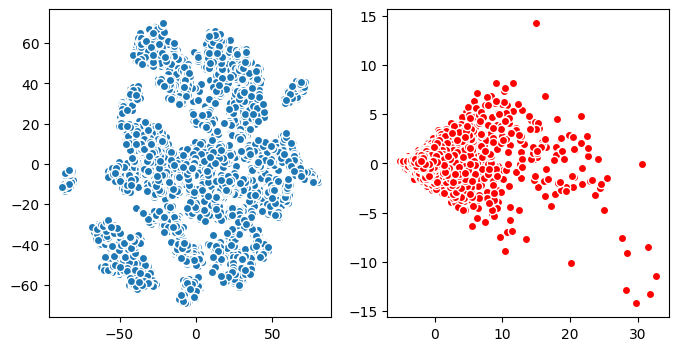

In [70]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.scatter(tsne_data[:,0], tsne_data[:,1], edgecolor = 'white')


plt.subplot(1,2,2)
plt.scatter(pca_data[:,0], pca_data[:,1], color = 'red', edgecolor = 'white')
plt.show()

In [73]:
X_scaled = np.array(X_scaled_withAge)

In [75]:
X_scaled[0]

array([ 0.81569539,  0.08290524, -0.28424219,  0.32745251, -0.02863704,
        0.32850542, -0.32459375, -0.35164214, -0.2097088 , -0.4233565 ,
       -0.54346576, -0.20970431, -0.29872083, -0.00920476, -1.21406557,
       -1.47849968, -0.65065821,  0.        ])

In [77]:
y = np.array(y)

In [80]:
from sklearn.model_selection import train_test_split

In [81]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.2,
                                                    random_state=42)

In [79]:
from sklearn.svm import SVR

In [85]:
y_train_motor = y_train[:,0]
y_train_total = y_train[:,1]

In [86]:
svr_motor = SVR()
svr_motor.fit(X_train, y_train_motor)

SVR()

In [87]:
svr_total = SVR()
svr_total.fit(X_train, y_train_total)

SVR()

In [88]:
y_pred_motor = svr_motor.predict(X_test)
y_pred_total = svr_total.predict(X_test)

In [89]:
from sklearn.metrics import mean_squared_error, r2_score

In [91]:
y_test

array([[33.084 , 43.563 ],
       [ 7.1599, 12.06  ],
       [11.218 , 14.109 ],
       ...,
       [18.    , 26.315 ],
       [15.    , 21.371 ],
       [14.225 , 16.4   ]])

In [94]:
motor_updrs = []
total_updrs = []

mse_motor = mean_squared_error(y_test[:,0], y_pred_motor)
r2_motor = r2_score(y_test[:,0], y_pred_motor)

mse_total = mean_squared_error(y_test[:,1], y_pred_total)
r2_total = r2_score(y_test[:,1], y_pred_total)

motor_updrs.append(f'motor mse: {mse_motor}')
motor_updrs.append(f'motor r2: {r2_motor}')

total_updrs.append(f'motor mse: {mse_total}')
total_updrs.append(f'motor r2: {r2_total}')



In [95]:
motor_updrs, total_updrs

(['motor mse: 43.56256833838902', 'motor r2: 0.3175137605093835'],
 ['motor mse: 80.31792602737454', 'motor r2: 0.27519429463942513'])

In [96]:
from sklearn.ensemble import RandomForestRegressor

In [99]:
rnd_clf = RandomForestRegressor()

In [100]:
rnd_clf.fit(X_train, y_train)

RandomForestRegressor()

In [101]:
y_pred = rnd_clf.predict(X_test)

In [102]:
y_pred

array([[30.46934 , 40.64582 ],
       [10.054615, 13.310412],
       [13.19277 , 15.55391 ],
       ...,
       [17.54285 , 26.01557 ],
       [14.583935, 21.147524],
       [15.44436 , 17.84267 ]])

In [108]:
print(f'{r2_score(y_test, y_pred)*100}%')

91.78077590485228%


In [105]:
mean_squared_error(y_test, y_pred)

7.045961164195189